**Autora**: Jayne de Morais Silva

**Email**: devjaynemorais@gmail.com

In [1]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import ipyplot
import os
import cv2
import time

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image 
from tensorflow.keras import callbacks, optimizers
from yolov4.tf import SaveWeightsCallback, YOLOv4

# module created for organizing utility functions
import utils as u


In [2]:
#Paths
PATH_PROJECT = './'
PATH_TRAINING_SET = PATH_PROJECT+'TrainingSet/'
PATH_TEST_SET = PATH_PROJECT+'TestSet/'
FILE_REFERENCE_DATA = PATH_PROJECT+'ReferenceData/wheres_wally_train.csv'

In [3]:
#Load File containing image annotations
DF_CENTROIDS = pd.read_csv(FILE_REFERENCE_DATA, sep=',', header=None, names=['NameFile', 'X', 'Y'])
DF_CENTROIDS.head(2)

,NameFile,X,Y
0,wally_000.jpg,555,574
1,wally_001.jpg,724,473


# Detalhes importantes

- Wally não gosta de ser encontrado. Quando questionado sobre a participação em nosso teste, ele pediu para revisar pessoalmente os dados primeiro. Nós nos perguntamos se ele adulterou os dados para atrapalhar nossas soluções...

## Resumo do Jupyter Notebook:

- Como mencionado, Walley não gosta de ser encontrado e para verificar se o mesmo adulterou os dados de treino, vamos realizar um análise exploratória para tentar identificar algo estranho (imagem com centróide ou delimitação do Wally com defeito);


- Na análise anterior foi possível identificar e constatar (ao verificar nos arquivos .csv) que existem anotações da imagem que não constam o total de 04 pontos da área que delimita a presença do Wally;


- Dessa forma, na etapa de pre-processamento, vamos selecionar apenas os registros cujo contém o total de 04 pontos delimitantes do Wally;


- Também realizaremos a extração e tratamento das informações advindas dos arquivos .json;


- O treinamento do modelo foi realizado através do You Only Look Once (YOLO), uma abordagem para a detecção e classificação de objetos, o qual parte do princípio de que basta “olhar” uma única vez em uma imagem para realizar a predição de quais objetos estão presentes e onde estão. 
    
    Trata-se de um modelo unificado como uma única rede neural convolucional para prever simultaneamente, tanto a localização do objeto através de coordenadas de caixas delimitadoras na imagem, quanto o cálculo da probabilidade da classe do objeto.
    
    Para isto, o treinamento do modelo do YOLO é feito diretamente com as imagens inteiras e otimizando o desempenho da detecção, ao contrário das técnicas baseadas em *sliding window* e região, que avaliam o objeto em vários locais e escalas em uma imagem de teste. Deste modo, o YOLO é capaz de codificar implicitamente as informações contextuais sobre as classes, bem como a sua aparência para fazer previsões e aprendendo representações generalizáveis dos objetos. Sendo assim, é também considerado um dos detectores de objetos em tempo real de propósito geral mais rápido e robustos da literatura.


- E por fim, vamos explorar visualmente as predições dos centróides realizadas pelo modelo, diretamente nas imagens.



**Referência: REDMON, Joseph et al. You only look once: Unified, real-time object detection. In: Proceedings of the IEEE conference on computer vision and pattern recognition. 2016. p. 779-788.**

## Análise Exploratória dos Dados

Inicialmente iremos fazer uma checagem para avaliar se os dados contidos nos arquivos correspondem realmente a imagem do Walley.

In [4]:
#Load image files from a given directory according to the file extension submitted
images = u.list_directory_files(PATH_TRAINING_SET, ".jpg")
print(images)

                            Path           File
0    ./TrainingSet/wally_000.jpg  wally_000.jpg
1    ./TrainingSet/wally_001.jpg  wally_001.jpg
2    ./TrainingSet/wally_002.jpg  wally_002.jpg
3    ./TrainingSet/wally_003.jpg  wally_003.jpg
4    ./TrainingSet/wally_006.jpg  wally_006.jpg
..                           ...            ...
115  ./TrainingSet/wally_143.jpg  wally_143.jpg
116  ./TrainingSet/wally_144.jpg  wally_144.jpg
117  ./TrainingSet/wally_146.jpg  wally_146.jpg
118  ./TrainingSet/wally_147.jpg  wally_147.jpg
119  ./TrainingSet/wally_148.jpg  wally_148.jpg

[120 rows x 2 columns]


In [5]:
# Presentation of training images organized in a grid
ipyplot.plot_images(images.Path.values, images.File.values, img_width=150)

In [6]:
#ipyplot.plot_class_tabs(images.Path.values, images.File.values, img_width=300)

In [7]:
#Load files files containing image annotations from a given directory according to the file extension submitted
df_info = u.list_directory_files(PATH_TRAINING_SET, ".json")
display(df_info.head(2))

,Path,File
0,./TrainingSet/wally_000.json,wally_000.json
1,./TrainingSet/wally_001.json,wally_001.json


In [8]:
#Defining Wally's bounding box design parameters
color = (255, 255, 0) # the color of line
thickness = 14 # the thickness of line

images_outlier = []
images = {
    'image': [],
    'label':[]
}

for index, row in df_info.iterrows():

    #Extract Info of the json
    info_json, points, image_name, tuple_points = u.extract_info_from_json(row['Path'])
    
    
    #Read Image
    image_path = PATH_TRAINING_SET + info_json['imagePath']
    img = cv2.imread(image_path[0])  
    
    #Verification of the number of points in the bounding area of Wally
    size = len(tuple_points) # the size of tuple points
    if(size!=4):
        images_outlier.append(image_name)
    
    #Plot Line between two points (For all points noted)
    for i in range(size - 1): # from 0 at size-1
        img = cv2.line(img, tuple_points[i], tuple_points[i + 1], color, thickness)     
    img = cv2.line(img, tuple_points[size-1], tuple_points[0], color, thickness)
        
    #Plot the centroid of the area where Wally is located
    img = u.insert_centroid(img, image_name, DF_CENTROIDS)
          
    #Returns
    images['image'].append(img)
    images['label'].append(image_name)
    

print(images_outlier)

['wally_007.jpg', 'wally_008.jpg', 'wally_045.jpg', 'wally_068.jpg', 'wally_077.jpg', 'wally_100.jpg', 'wally_141.jpg']


C:\Users\jayne\anaconda3\envs\basic\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)



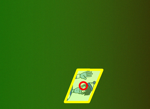
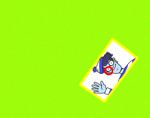
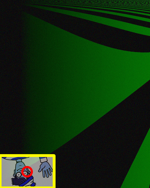
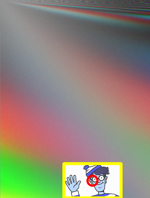
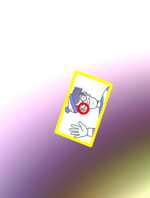
...
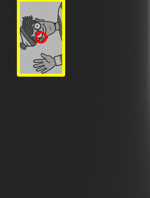
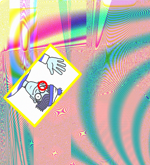
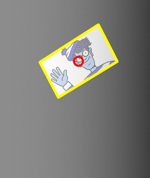
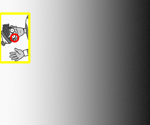
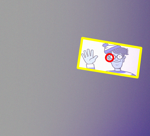

In [9]:
# Presentation of training images organized in a grid
ipyplot.plot_images(images['image'], images['label'], img_width=150)

## Data Preparing

In [10]:
def pre_processing_data(path, extension, outlier_sample_list):
    try:
        
        files = []
        #configure (create if not exists) the directory path
        path_data_yolo = u.configure_dir(PATH_PROJECT, 'data/')
        data_save = pd.DataFrame(columns=['file', 'class_id', 'x_center', 'y_center', 'w_distance', 'h_distance'])
        
        #path verify
        if(os.path.isdir(path)): 
            entries = os.listdir(path)
            for entry in entries:

                #Check that the file extension format ends with .jpg and that the file is not listed as outlier (less than 04 points)
                if entry.endswith(extension) and (entry.replace('.json', '.jpg') not in outlier_sample_list):
                    file = os.path.join(path, entry)

                    #file verify
                    if os.path.isfile(file):
                        files.append(entry)
                        
                        #Extract the notes contained in json and return formatted in different variables
                        info_json, points, image_name, tuple_points = u.extract_info_from_json(PATH_TRAINING_SET+entry)                     
                        
                        #Calculates and returns the maximum and minimum of the x's and y's (box) and the height and width of the real image.
                        xmin, xmax, ymin, ymax, height, width = u.processing_data_json(tuple_points, PATH_TRAINING_SET, image_name)
                        
                        #Convert annotations to yolo format and return
                        data_yolo = u.yolo_formatter(image_name, width, height, (xmin, xmax), (ymin, ymax))
                        
                        #Concat
                        data_save = data_save.append(data_yolo, ignore_index=True)
            #Save
            data_save.to_csv(path_data_yolo+'training_formatted_all.txt', sep=' ', header=None, index=False)

        return data_save, files

    except Exception as error:
        raise

data, si = pre_processing_data(PATH_TRAINING_SET, 'json', images_outlier)
print(len(si))

113


In [11]:
#Separating training and test sets
X_train, X_test = train_test_split(data, test_size=0.3, random_state=42)

In [12]:
#Saving format notes to yolo
X_train.to_csv('data/training_formatted.txt', sep=' ', header=None, index=False)
X_test.to_csv('data/test_formatted.txt', sep=' ', header=None, index=False)

In [13]:
X_train.shape

(79, 7)

In [14]:
X_test.shape

(34, 7)

## Modeling

In [15]:
# Instance the yolo model
yolo = YOLOv4()
yolo.classes = "data/obj.names" #class defined for target
yolo.input_size = 128 # set the heigth, width to (128, 128)
yolo.batch_size = 16
yolo.make_model()

train_data_set = yolo.load_dataset(
    "data/training_formatted.txt",
    image_path_prefix=PATH_TRAINING_SET,
    label_smoothing=0.05
)

test_data_set = yolo.load_dataset(
    "data/test_formatted.txt",
    image_path_prefix=PATH_TRAINING_SET,
    label_smoothing=0.05,
    training=False
)

epochs = 20 #number of the epochs
lr = 1e-4 #learning rate

# Defining optmizers
optimizer = optimizers.Adam(learning_rate=lr)
yolo.compile(optimizer=optimizer, loss_iou_type="ciou")


# function to decrease the learning rate in epochs
# this function recieves:
    # epoch: int, the current epoch 
    # return a learning rate

def lr_scheduler(epoch):
    if epoch < int(epochs * 0.6):
        return lr
    if epoch < int(epochs * 0.8):
        return lr * 0.5
    if epoch < int(epochs * 0.9):
        return lr * 0.1
    return lr * 0.01

# Defining callbacks to use tensorboard
_callbacks = [
    callbacks.LearningRateScheduler(lr_scheduler),
    callbacks.TerminateOnNaN(),
    callbacks.TensorBoard(
        log_dir="logs",
    ),
    SaveWeightsCallback(
        yolo=yolo, dir_path="model_trained",
        weights_type="yolo", 
        epoch_per_save=1
    ),
]



Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


**Atenção: Devido a uma limitação de hardware, preferi realizar o treinamento no Google Colab e posteriormente baixar os pesos pré-treinados do modelo treinado e usá-los neste jupyter notebook.**

**Também preferi manter a versão local do jupyter notebook para não incluir blocos de configurtação específica do Google Colab**

In [16]:
#load pre-trained pressures
yolo.fit(
    train_data_set,
    epochs=epochs,
    validation_data=test_data_set,
    steps_per_epoch=100,
    validation_steps=10,
    validation_freq=5,
    verbose=1,
    callbacks=_callbacks
)

#yolo.save_as_tflite('yolo_model') Model Save in Colab

Epoch 1/20
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


KeyboardInterrupt: 

In [17]:
#load pre-trained pressures
yolo.load_weights(
    "./model_trained/yolov4-40.weights",#"./model_trained/yolov4-20.weights",
    weights_type="yolo"
)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Index'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


C:\Users\jayne\anaconda3\envs\basic\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)



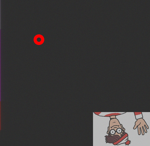
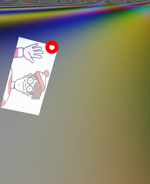
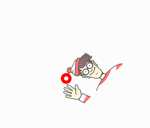
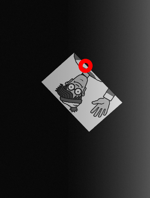
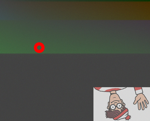
...
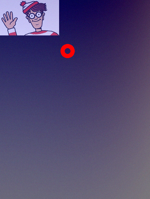
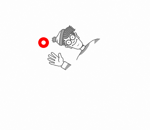
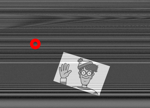
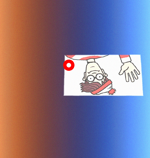
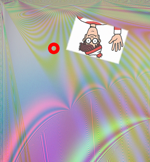

In [18]:
#Defining Wally's bounding box design parameters

color = (255, 255, 0) # the color of line
thickness = 14 # the thickness of line
images_outlier = []
images = {
    'image': [],
    'label':[]
}

df_submission = pd.DataFrame(columns=['file_name', 'x', 'y'])

#Lists all image files
df_test = u.list_directory_files(PATH_TEST_SET, ".jpg")

#For each image file
for index, row in df_test.iterrows():
    
    # load image
    loaded_image = image.load_img(row['Path']) 
    loaded_image = np.array(loaded_image)

    #return [[center_x, center_y, w, h, class_id, propability], ...]
    boxes = yolo.predict(loaded_image, score_threshold=0.50) # get the boxes
    
    #Definition of points x and y calculated from the box cetroid predicted by the yolo, considering the size of the real image
    x = int(boxes[0][0] * loaded_image.shape[0])
    y = int(boxes[0][1] * loaded_image.shape[1])
    
    #Draw centroid
    img = cv2.circle(loaded_image, 
                      (x, y), 
                      radius=25, 
                      color=(255, 0, 0), 
                      thickness=20)
    
    #Read Image
    image_path = row['Path']
    image_name = row['File']

    #Returns
    images['image'].append(img)
    images['label'].append(image_name)
    
    new_row = {'file_name': image_name, 'x': x, 'y': y}
    df_submission = df_submission.append(new_row, ignore_index=True)
    

ipyplot.plot_images(images['image'], images['label'], img_width=150)

In [19]:
#Generating submission file
df_submission.to_csv('wheres_wally_submission-devjaynemorais.csv', sep=',', header=None, index=False, decimal='.')

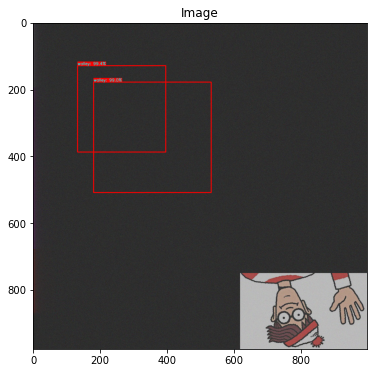

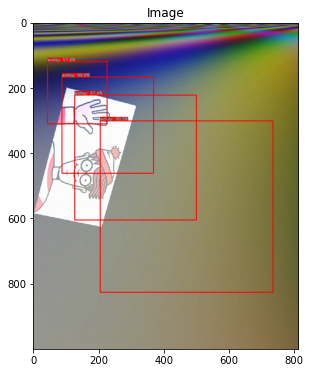

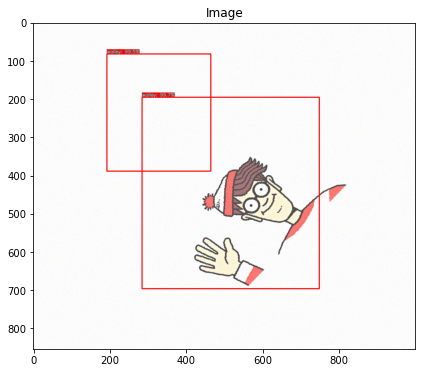

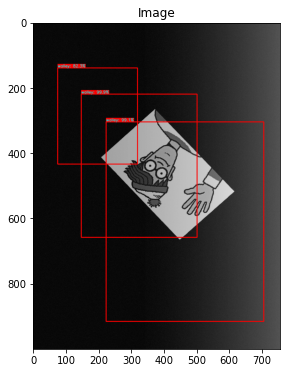

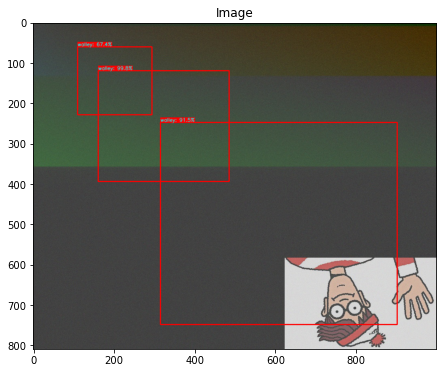

...

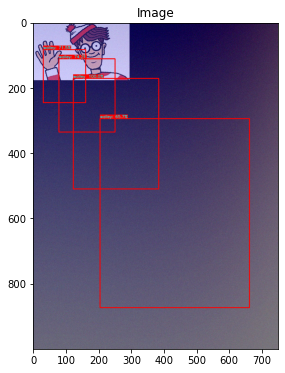

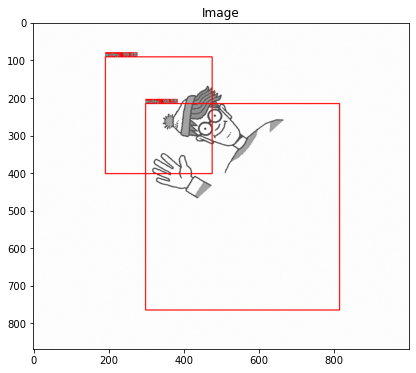

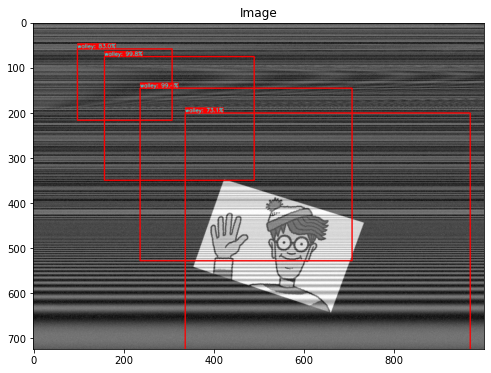

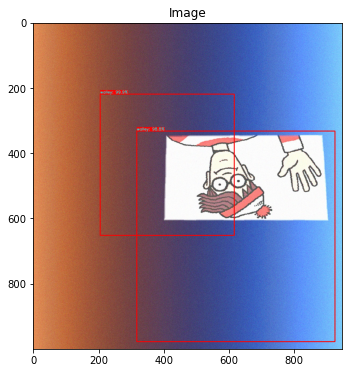

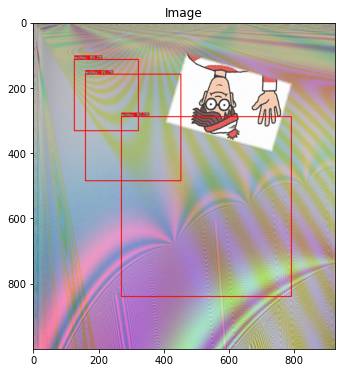

In [ ]:
color = (255, 255, 0) # the color of line
thickness = 14 # the thickness of line
images_outlier = []
images = {
    'image': [],
    'label':[]
}

df_submission = pd.DataFrame(columns=['file_name', 'x', 'y'])

#Lists all image files
df_test = u.list_directory_files(PATH_TEST_SET, ".jpg")

#For each image file
for index, row in df_test.iterrows():
    
    loaded_image = image.load_img(row['Path']) # load image
    loaded_image = np.array(loaded_image)

    #return [[center_x, center_y, w, h, class_id, propability], ...]
    boxes = yolo.predict(loaded_image, score_threshold=0.50) # get the boxes
    
    #draw boxes
    drawned_img = yolo.draw_bboxes(loaded_image, boxes)
    
    #Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(drawned_img,  cmap='gray', vmin=0, vmax=255)
    ax.set_title('Image')
    plt.show()

ipyplot.plot_images(images['image'], images['label'], img_width=150)

### Referências

https://pjreddie.com/darknet/yolo/

https://wiki.loliot.net/docs/lang/python/libraries/yolov4/python-yolov4-training